In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import numpy as np


noc_region_df = pd.read_csv('../Data/noc_regions.csv')
athlete_events_df = pd.read_csv('../Data/athlete_events.csv')

merged_df = pd.merge(athlete_events_df, noc_region_df, how='inner', on='NOC')

Uppgift. 0

In [2]:
# a. hur många länder som är med i datan?
num_countries = merged_df['region'].nunique()
print(f'a. total countries in the dataset: {num_countries}')

a. total countries in the dataset: 205


In [3]:
# b. Vilka länder är med?
countries = merged_df['region'].unique()
print(f'b. Vilka länder är med? \n{countries}')

b. Vilka länder är med? 
['China' 'Denmark' 'Netherlands' 'USA' 'Finland' 'Norway' 'Romania'
 'Estonia' 'France' 'Morocco' 'Spain' 'Egypt' 'Iran' 'Bulgaria' 'Italy'
 'Chad' 'Azerbaijan' 'Sudan' 'Russia' 'Argentina' 'Cuba' 'Belarus'
 'Greece' 'Cameroon' 'Turkey' 'Chile' 'Mexico' 'Nicaragua' 'Hungary'
 'Nigeria' 'Algeria' 'Kuwait' 'Bahrain' 'Pakistan' 'Iraq' 'Syria'
 'Lebanon' 'Qatar' 'Malaysia' 'Germany' 'Canada' 'Ireland' 'Australia'
 'South Africa' 'Eritrea' 'Tanzania' 'Jordan' 'Tunisia' 'Libya' 'Belgium'
 'Djibouti' 'Palestine' 'Comoros' 'Kazakhstan' 'Brunei' 'India'
 'Saudi Arabia' 'Maldives' 'Ethiopia' 'United Arab Emirates' 'Yemen'
 'Indonesia' 'Philippines' 'Uzbekistan' 'Kyrgyzstan' 'Tajikistan' 'Japan'
 'Republic of Congo' 'Switzerland' 'Brazil' 'Monaco' 'Israel' 'Uruguay'
 'Sweden' 'Virgin Islands, US' 'Sri Lanka' 'Armenia' 'Ivory Coast' 'Kenya'
 'Benin' 'Ukraine' 'UK' 'Ghana' 'Somalia' 'Latvia' 'Niger' 'Mali'
 'Afghanistan' 'Poland' 'Costa Rica' 'Panama' 'Georgia' 'Slovenia'
 

In [4]:
# c. Vilka sporter är med?
sports = merged_df['Sport'].unique()
print(f'c. Vilka sporter är med? {sports}')

c. Vilka sporter är med? ['Basketball' 'Judo' 'Football' 'Tug-Of-War' 'Speed Skating'
 'Cross Country Skiing' 'Athletics' 'Ice Hockey' 'Swimming' 'Badminton'
 'Sailing' 'Biathlon' 'Gymnastics' 'Art Competitions' 'Alpine Skiing'
 'Handball' 'Weightlifting' 'Wrestling' 'Luge' 'Water Polo' 'Hockey'
 'Rowing' 'Bobsleigh' 'Fencing' 'Equestrianism' 'Shooting' 'Boxing'
 'Taekwondo' 'Cycling' 'Diving' 'Canoeing' 'Tennis' 'Modern Pentathlon'
 'Figure Skating' 'Golf' 'Softball' 'Archery' 'Volleyball'
 'Synchronized Swimming' 'Table Tennis' 'Nordic Combined' 'Baseball'
 'Rhythmic Gymnastics' 'Freestyle Skiing' 'Rugby Sevens' 'Trampolining'
 'Beach Volleyball' 'Triathlon' 'Ski Jumping' 'Curling' 'Snowboarding'
 'Rugby' 'Short Track Speed Skating' 'Skeleton' 'Lacrosse' 'Polo'
 'Cricket' 'Racquets' 'Motorboating' 'Military Ski Patrol' 'Croquet'
 'Jeu De Paume' 'Roque' 'Alpinism' 'Basque Pelota' 'Aeronautics']


In [5]:
# d. Vilka medaljtyper finns det?
medal_types = merged_df['Medal'].dropna().unique()
print(f'd. Vilka medaljtyper finns det? {medal_types}')

d. Vilka medaljtyper finns det? ['Gold' 'Bronze' 'Silver']


In [6]:
# e. Statistik för åldern
age_stats = merged_df['Age'].describe()
print(f'e. Statistik för åldern:\n{age_stats}')

e. Statistik för åldern:
count    261305.000000
mean         25.559783
std           6.392501
min          10.000000
25%          21.000000
50%          24.000000
75%          28.000000
max          97.000000
Name: Age, dtype: float64


In [7]:
# f) Åldersfördelning inom varje sport
fig = px.box(merged_df, x='Sport', y='Age', title='Åldersfördelning inom varje sport')
fig.update_layout(xaxis=dict(tickangle=90))
fig.show()

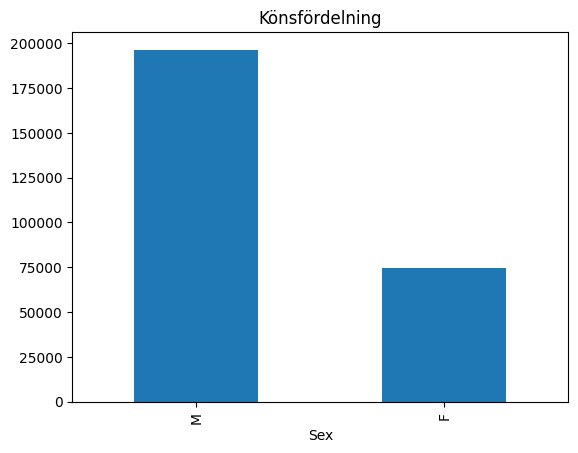

In [8]:
# g. Diagram över könsfördelningen
gender_distribution = merged_df['Sex'].value_counts()
gender_distribution.plot(kind='bar', title='Könsfördelning')
plt.show()

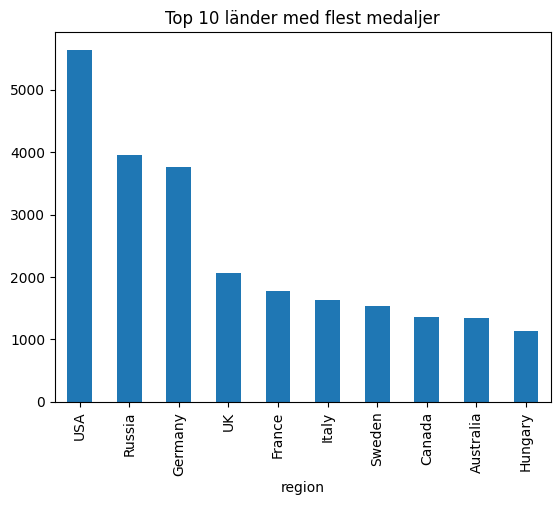

In [9]:
# h. Diagram över topp 10 länder som tagit flest medaljer
top_countries = merged_df.groupby('region')['Medal'].count().sort_values(ascending=False).head(10)
top_countries.plot(kind='bar', title='Top 10 länder med flest medaljer')
plt.show()

In [10]:
# i) The progression of how many female olympic sports participants there are over the years
women_df = merged_df[merged_df['Sex'] == 'F']

# Count the number of women in each year
women_per_year = women_df.groupby('Year').size().reset_index(name='Number of Women')

# Create an interactive bar graph using Plotly Express
fig = px.bar(women_per_year, x='Year', y='Number of Women', title='Number of Women in Each Year of the Olympics',
             labels={'Number of Women': 'Number of Women', 'Year': 'Year'})

fig.show()

In [ ]:
# i) The progression of how many female olympic sports participants there are over the years and season

# Count the number of women in each year for Summer Olympics
women_summer_df = merged_df[(merged_df['Sex'] == 'F') & (merged_df['Season'] == 'Summer')]
women_summer_per_year = women_summer_df.groupby('Year').size().reset_index(name='Number of Women')

# Count the number of women in each year for Winter Olympics
women_winter_df = merged_df[(merged_df['Sex'] == 'F') & (merged_df['Season'] == 'Winter')]
women_winter_per_year = women_winter_df.groupby('Year').size().reset_index(name='Number of Women')

fig_summer = px.bar(women_summer_per_year, x='Year', y='Number of Women',
                    title='Number of Women in Each Year of the Summer Olympics',
                    labels={'Number of Women': 'Number of Women', 'Year': 'Year'})

fig_winter = px.bar(women_winter_per_year, x='Year', y='Number of Women',
                    title='Number of Women in Each Year of the Winter Olympics',
                    labels={'Number of Women': 'Number of Women', 'Year': 'Year'})

# Show the interactive graphs
fig_summer.show()
fig_winter.show()   

## Uppgift 2

### Gymnastic

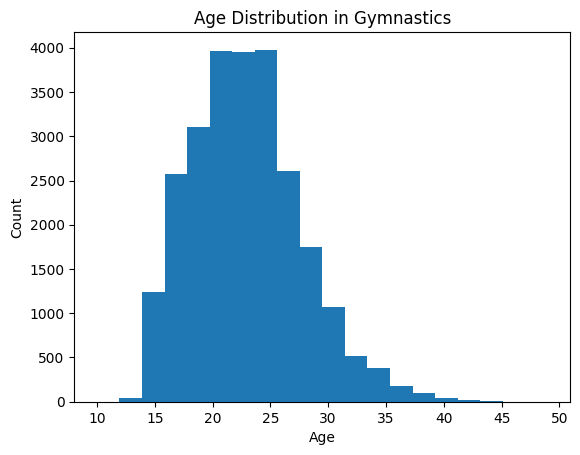

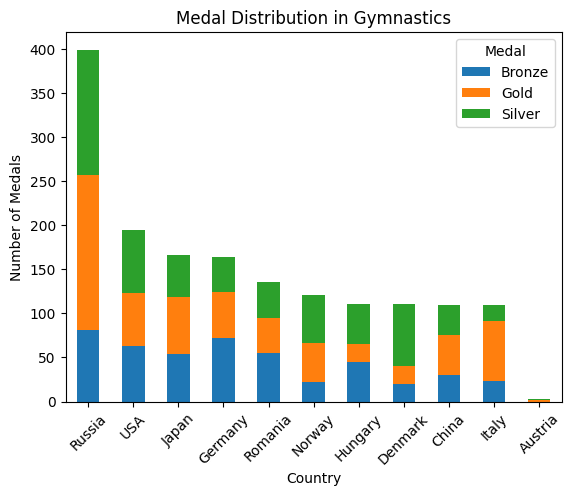

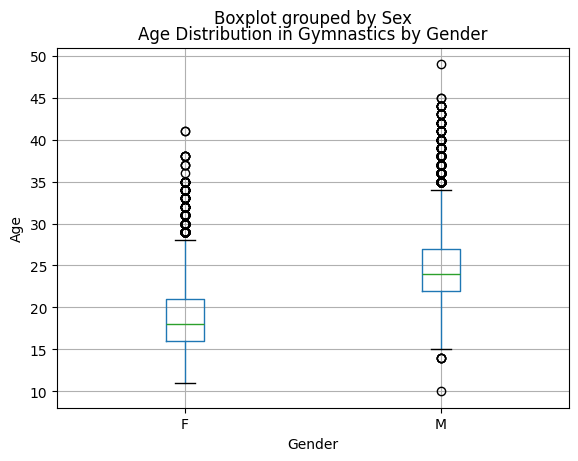

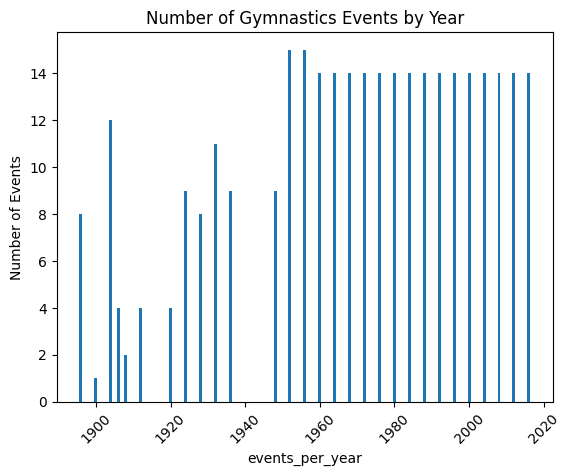

In [16]:
# Plot the age distribution histogram
def plot_age_distribution(sport_df, sport_name):
    plt.hist(sport_df['Age'].dropna(), bins=20)
    plt.title(f'Age Distribution in {sport_name}')
    plt.xlabel('Age')
    plt.ylabel('Count')
    plt.show()


# Medal distribution between countries
def plot_medal_distribution(sport_df, sport_name):
    medal_distribution = sport_df.groupby(['region', 'Medal']).size().unstack(fill_value=0)
    medal_distribution["Total"] = medal_distribution.sum(axis=1)
    top10 = medal_distribution.sort_values("Total", ascending=False).head(10)
    austria = medal_distribution[medal_distribution.index == "Austria"]
    filtered = pd.concat([top10, austria]).drop_duplicates()
    filtered = filtered.drop(columns=["Total"])
    filtered.plot(kind='bar', stacked=True, title=f'Medal Distribution in {sport_name}')
    plt.xlabel('Country')
    plt.ylabel('Number of Medals')
    plt.xticks(rotation=45)
    plt.show()

def plot_age_by_gender(sport_df, sport_name):
    sport_df.boxplot(column='Age', by='Sex')
    plt.title(f'Age Distribution in {sport_name} by Gender')
    plt.xlabel('Gender')
    plt.ylabel('Age')
    plt.show()


# Plot number of events per year
def plot_events_by_year(sport_df, sport_name):
    events_per_year = sport_df.groupby('Year')['Event'].nunique()
    plt.bar(events_per_year.index, events_per_year.values)
    plt.title(f'Number of {sport_name} Events by Year')
    plt.xlabel('events_per_year')
    plt.ylabel('Number of Events')
    plt.xticks(rotation=45)
    plt.show()


# Run full sport analysis
def analyze_sport(merged_df, sport='Gymnastics'):
    sport_df = merged_df[merged_df['Sport'] == sport].copy()

    plot_age_distribution(sport_df, sport)
    plot_medal_distribution(sport_df, sport)
    plot_age_by_gender(sport_df, sport)
    plot_events_by_year(sport_df, sport)


analyze_sport(merged_df, sport="Gymnastics")
